# **Importing Libraries**

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
from datetime import datetime
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.model_selection import train_test_split

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/CENTAIC/energydata_complete.csv')

In [ ]:
df.head()

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,...,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
1,2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,...,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2,2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,...,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
3,2016-01-11 17:30:00,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,...,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389
4,2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,...,17.000000,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


# **Exploratory Data Analysis**

In [ ]:
obs, cols = df.shape
print("Totla Number of Observations : ", obs)
print("TOtal Number of Columns : ", cols)

Totla Number of Observations :  19735
TOtal Number of Columns :  29


In [ ]:
list_cols = df.columns
print("List of Columns in a dataset : ", list_cols)

List of Columns in a dataset :  Index(['date', 'Appliances', 'lights', 'T1', 'RH_1', 'T2', 'RH_2', 'T3',
       'RH_3', 'T4', 'RH_4', 'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8',
       'RH_8', 'T9', 'RH_9', 'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed',
       'Visibility', 'Tdewpoint', 'rv1', 'rv2'],
      dtype='object')


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 29 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   date         19735 non-null  object 
 1   Appliances   19735 non-null  int64  
 2   lights       19735 non-null  int64  
 3   T1           19735 non-null  float64
 4   RH_1         19735 non-null  float64
 5   T2           19735 non-null  float64
 6   RH_2         19735 non-null  float64
 7   T3           19735 non-null  float64
 8   RH_3         19735 non-null  float64
 9   T4           19735 non-null  float64
 10  RH_4         19735 non-null  float64
 11  T5           19735 non-null  float64
 12  RH_5         19735 non-null  float64
 13  T6           19735 non-null  float64
 14  RH_6         19735 non-null  float64
 15  T7           19735 non-null  float64
 16  RH_7         19735 non-null  float64
 17  T8           19735 non-null  float64
 18  RH_8         19735 non-null  float64
 19  T9  

In [ ]:
df['date'] = pd.to_datetime(df['date'])

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 29 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   date         19735 non-null  datetime64[ns]
 1   Appliances   19735 non-null  int64         
 2   lights       19735 non-null  int64         
 3   T1           19735 non-null  float64       
 4   RH_1         19735 non-null  float64       
 5   T2           19735 non-null  float64       
 6   RH_2         19735 non-null  float64       
 7   T3           19735 non-null  float64       
 8   RH_3         19735 non-null  float64       
 9   T4           19735 non-null  float64       
 10  RH_4         19735 non-null  float64       
 11  T5           19735 non-null  float64       
 12  RH_5         19735 non-null  float64       
 13  T6           19735 non-null  float64       
 14  RH_6         19735 non-null  float64       
 15  T7           19735 non-null  float64       
 16  RH_7

In [ ]:
  df.isnull().sum()

Appliances_energy     0
lights_energy         0
T_kitchen             0
RH_kitchen            0
T_livingroom          0
RH_livingroom         0
T_laundryroom         0
RH_laundryroom        0
T_officeroom          0
RH_officeroom         0
T_bathroom            0
RH_bathroom           0
T_OutsideBuliding     0
RH_OutsideBuilding    0
T_ironingroom         0
RH_ironingroom        0
T_teenagerroom2       0
RH_teenagerroom2      0
T_parentsroom         0
RH_parentsroom        0
T_out                 0
Press_mm_hg           0
RH_out                0
Windspeed             0
Visibility            0
Tdewpoint             0
rv1                   0
rv2                   0
dtype: int64

In [ ]:
df.set_index('date', inplace=True)

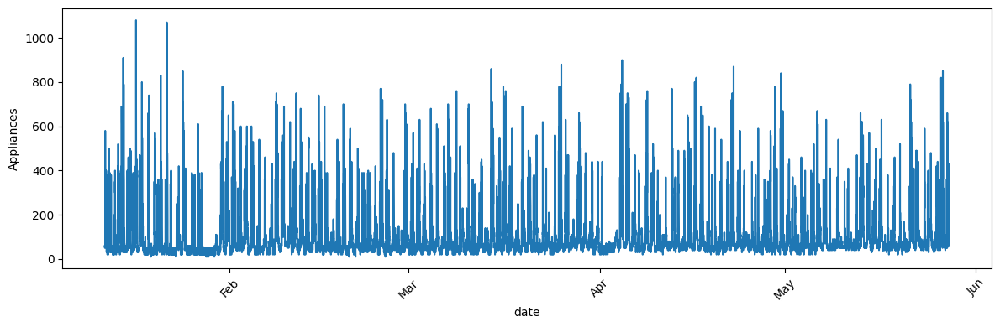

In [ ]:
plt.figure(figsize=(12, 4))
sns.lineplot(data=df, x=df.index, y='Appliances')
ax = plt.gca()
# Set major ticks format
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b'))
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
unique_years = df.index.to_period('Y').nunique()
print(f'The dataset spans {unique_years} unique Years.')

The dataset spans 1 unique Years.


In [ ]:
unique_months = df.index.to_period('M').nunique()
print(f'The dataset spans {unique_months} unique Months.')

The dataset spans 5 unique Months.


In [ ]:
df_reset = df.reset_index()
fig = px.line(df_reset, x='date', y=df_reset.columns[1:], title='All Features over time')
fig.show()

We observe distinct peaks representing periods of both high and low appliance usage, likely indicative of nighttime and daytime, respectively.

In [ ]:
df.rename(columns = {'Appliances':'Appliances_energy'}, inplace = True)
df.rename(columns={'lights':'lights_energy'} ,inplace=True)
df.rename(columns={'T1':'T_kitchen'} ,inplace=True)
df.rename(columns={'RH_1':'RH_kitchen'} ,inplace=True)
df.rename(columns={'T2':'T_livingroom'} ,inplace=True)
df.rename(columns={'RH_2':'RH_livingroom'} ,inplace=True)
df.rename(columns={'T3':'T_laundryroom'} ,inplace=True)
df.rename(columns={'RH_3':'RH_laundryroom'} ,inplace=True)
df.rename(columns={'T4':'T_officeroom'} ,inplace=True)
df.rename(columns={'RH_4':'RH_officeroom'} ,inplace=True)
df.rename(columns={'T5':'T_bathroom'} ,inplace=True)
df.rename(columns={'RH_5':'RH_bathroom'} ,inplace=True)
df.rename(columns={'T6':'T_OutsideBuliding'} ,inplace=True)
df.rename(columns={'RH_6':'RH_OutsideBuilding'} ,inplace=True)
df.rename(columns={'T7':'T_ironingroom'} ,inplace=True)
df.rename(columns={'RH_7':'RH_ironingroom'} ,inplace=True)
df.rename(columns={'T8':'T_teenagerroom2'} ,inplace=True)
df.rename(columns={'RH_8':'RH_teenagerroom2'} ,inplace=True)
df.rename(columns={'T9':'T_parentsroom'} ,inplace=True)
df.rename(columns={'RH_9':'RH_parentsroom'} ,inplace=True)

In [ ]:
df_lights_energy = df.groupby('lights_energy').agg({'Appliances_energy' : 'mean', 'T_kitchen':'mean', 'RH_kitchen':'mean',
                                                   'T_livingroom':'mean', 'RH_livingroom':'mean', 'T_laundryroom':'mean',
                                                    'RH_laundryroom':'mean','T_officeroom':'mean', 'RH_officeroom':'mean',
                                                    'T_bathroom':'mean', 'RH_bathroom':'mean','T_OutsideBuliding':'mean',
                                                    'RH_OutsideBuilding':'mean', 'T_ironingroom':'mean','RH_ironingroom':'mean',
                                                    'T_teenagerroom2':'mean', 'RH_teenagerroom2':'mean','T_parentsroom':'mean',
                                                    'RH_parentsroom':'mean', 'T_out':'mean', 'Press_mm_hg':'mean',
                                                    'RH_out':'mean','Windspeed':'mean', 'Visibility':'mean',
                                                   'Tdewpoint':'mean', 'rv1':'mean', 'rv2':'mean'})
df_lights_energy

,Appliances_energy,T_kitchen,RH_kitchen,T_livingroom,RH_livingroom,T_laundryroom,RH_laundryroom,T_officeroom,RH_officeroom,T_bathroom,...,T_parentsroom,RH_parentsroom,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
lights_energy,,,,,,,,,,,,,,,,,,,,,
0,86.584710,21.723160,40.050783,20.363159,40.340166,22.389374,39.044983,20.896750,38.794301,19.680537,...,19.669194,41.597347,7.646922,755.518225,79.260580,3.961235,38.166151,3.875474,24.965617,24.965617
10,129.037071,21.379647,40.739160,20.091564,40.436926,21.739672,39.624906,20.332763,39.437247,19.182483,...,18.821852,41.470343,6.552540,755.923386,80.790585,4.256247,39.202469,3.175979,25.220429,25.220429
20,136.428571,21.809905,40.955904,20.498642,40.772480,22.077684,39.908179,21.207834,39.923208,19.522776,...,19.060631,41.032837,6.846420,755.099221,81.391435,4.296036,38.488711,3.603791,24.784330,24.784330
30,150.214669,21.650877,41.501385,20.329447,41.179115,21.773656,40.539395,20.957212,40.480007,19.224056,...,18.666624,41.732034,6.290370,755.652803,82.874776,4.450507,38.473465,3.374389,25.551771,25.551771
40,182.337662,21.051775,43.693539,19.980135,42.667587,21.170985,43.368568,19.708766,43.235216,18.257466,...,17.455363,44.280715,5.614502,753.795455,88.876623,4.757576,41.207792,3.846753,23.060086,23.060086
50,178.888889,20.885556,43.118889,20.145556,41.607778,20.560370,42.761481,19.405926,42.720741,17.751049,...,17.475556,43.974074,7.216667,752.216667,83.407407,5.611111,40.851852,4.362963,27.523265,27.523265
60,580.000000,20.066667,46.396667,19.426667,44.400000,19.790000,44.826667,19.000000,46.430000,17.100000,...,16.890000,45.290000,5.983333,734.433333,91.166667,5.833333,40.000000,4.616667,8.827838,8.827838
70,230.000000,19.926667,45.863333,19.356667,44.400000,19.790000,44.900000,18.890000,46.430000,17.100000,...,17.000000,45.290000,5.966667,734.366667,91.333333,5.666667,40.000000,4.633333,10.298729,10.298729


In [ ]:
px.bar(data_frame=df_lights_energy.drop(['Press_mm_hg','Appliances_energy'],axis = 1), barmode='group',orientation = 'h',
       width=1000, height=1600,title = "<b>Categories of lights energy</b>")

In [ ]:
px.bar(data_frame=df_lights_energy[['Press_mm_hg','Appliances_energy']], barmode='group',
       width=1000, height=500,title = "<b>Categories of lights energy</b>")

In [ ]:
descriptive_stats = df.describe(include='all')
descriptive_stats

,Appliances_energy,lights_energy,T_kitchen,RH_kitchen,T_livingroom,RH_livingroom,T_laundryroom,RH_laundryroom,T_officeroom,RH_officeroom,...,T_parentsroom,RH_parentsroom,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
count,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,...,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000
mean,97.694958,3.801875,21.686571,40.259739,20.341219,40.420420,22.267611,39.242500,20.855335,39.026904,...,19.485828,41.552401,7.411665,755.522602,79.750418,4.039752,38.330834,3.760707,24.988033,24.988033
std,102.524891,7.935988,1.606066,3.979299,2.192974,4.069813,2.006111,3.254576,2.042884,4.341321,...,2.014712,4.151497,5.317409,7.399441,14.901088,2.451221,11.794719,4.194648,14.496634,14.496634
min,10.000000,0.000000,16.790000,27.023333,16.100000,20.463333,17.200000,28.766667,15.100000,27.660000,...,14.890000,29.166667,-5.000000,729.300000,24.000000,0.000000,1.000000,-6.600000,0.005322,0.005322
25%,50.000000,0.000000,20.760000,37.333333,18.790000,37.900000,20.790000,36.900000,19.530000,35.530000,...,18.000000,38.500000,3.666667,750.933333,70.333333,2.000000,29.000000,0.900000,12.497889,12.497889
50%,60.000000,0.000000,21.600000,39.656667,20.000000,40.500000,22.100000,38.530000,20.666667,38.400000,...,19.390000,40.900000,6.916667,756.100000,83.666667,3.666667,40.000000,3.433333,24.897653,24.897653
75%,100.000000,0.000000,22.600000,43.066667,21.500000,43.260000,23.290000,41.760000,22.100000,42.156667,...,20.600000,44.338095,10.408333,760.933333,91.666667,5.500000,40.000000,6.566667,37.583769,37.583769
max,1080.000000,70.000000,26.260000,63.360000,29.856667,56.026667,29.236000,50.163333,26.200000,51.090000,...,24.500000,53.326667,26.100000,772.300000,100.000000,14.000000,66.000000,15.500000,49.996530,49.996530


In [ ]:
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)
def create_sequences(data, seq_length):
    xs = []
    ys = []
    for i in range(len(data)-seq_length-1):
        x = data[i:(i+seq_length)]
        y = data[i+seq_length]
        xs.append(x)
        ys.append(y)
    return np.array(xs), np.array(ys)
seq_length = 10
X, y = create_sequences(scaled_data, seq_length)

In [ ]:
X.shape

(19724, 10, 28)

In [ ]:
y.shape

(19724, 28)

# **LSTM**

In [ ]:
model = Sequential()
model.add(LSTM(128, input_shape=(X.shape[1], X.shape[2]), return_sequences=True))
# model.add(Dropout(0.2))
model.add(LSTM(64, return_sequences=False))
# model.add(Dropout(0.2))
# model.add(LSTM(32, return_sequences=False))
# model.add(Dropout(0.2))
model.add(Dense(X.shape[2]))

model.compile(optimizer='adam', loss='mae', metrics=['accuracy'])

In [ ]:
history = model.fit(X, y, epochs=20, batch_size=16, validation_split=0.2, shuffle=False)

Epoch 1/20
987/987 [==============================] - 17s 9ms/step - loss: 0.0874 - accuracy: 0.4661 - val_loss: 0.2004 - val_accuracy: 0.1932
Epoch 2/20
987/987 [==============================] - 6s 6ms/step - loss: 0.0855 - accuracy: 0.4939 - val_loss: 0.2066 - val_accuracy: 0.1992
Epoch 3/20
987/987 [==============================] - 8s 9ms/step - loss: 0.0830 - accuracy: 0.5021 - val_loss: 0.2011 - val_accuracy: 0.2210
Epoch 4/20
987/987 [==============================] - 6s 6ms/step - loss: 0.0805 - accuracy: 0.5179 - val_loss: 0.1905 - val_accuracy: 0.2654
Epoch 5/20
987/987 [==============================] - 7s 7ms/step - loss: 0.0769 - accuracy: 0.5072 - val_loss: 0.1787 - val_accuracy: 0.2583
Epoch 6/20
987/987 [==============================] - 9s 9ms/step - loss: 0.0724 - accuracy: 0.5128 - val_loss: 0.1701 - val_accuracy: 0.2877
Epoch 7/20
987/987 [==============================] - 7s 7ms/step - loss: 0.0681 - accuracy: 0.5290 - val_loss: 0.1481 - val_accuracy: 0.2958
Epoch

In [ ]:
def plot_history(history):
  fig, axs = plt.subplots(2)

  #create accuracy subplot
  axs[0].plot(history.history["accuracy"], label = 'train accuracy')
  axs[0].plot(history.history["val_accuracy"], label= 'test accuracy')
  axs[0].set_ylabel("Accuracy")
  axs[0].legend(loc='lower right')
  axs[0].set_title("Accuracy eval")


  #create loss subplot
  axs[1].plot(history.history["loss"], label = 'train error')
  axs[1].plot(history.history["val_loss"], label = 'test error')
  axs[1].set_ylabel("Error")
  axs[1].set_xlabel("Epochs")
  axs[1].legend(loc='upper right')
  axs[1].set_title("Error eval")

  plt.show()

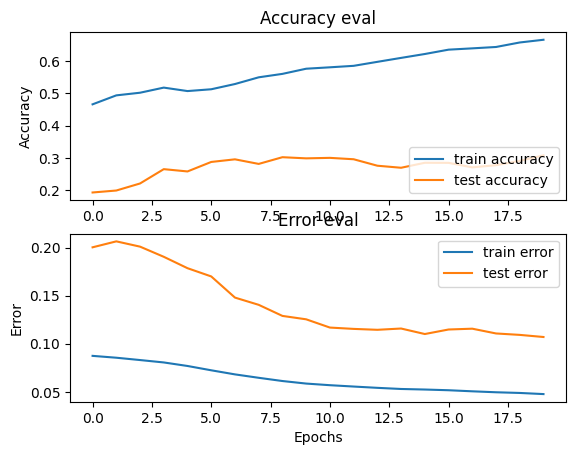

In [ ]:
plot_history(history)

In [ ]:
predictions = model.predict(X)

# Calculate MSE
mse = np.mean(np.power(y - predictions, 2), axis=1)

threshold = np.quantile(mse, 0.98)
anomalies = mse > threshold

617/617 [==============================] - 2s 3ms/step


In [ ]:
anomalies

array([False, False, False, ...,  True, False, False])

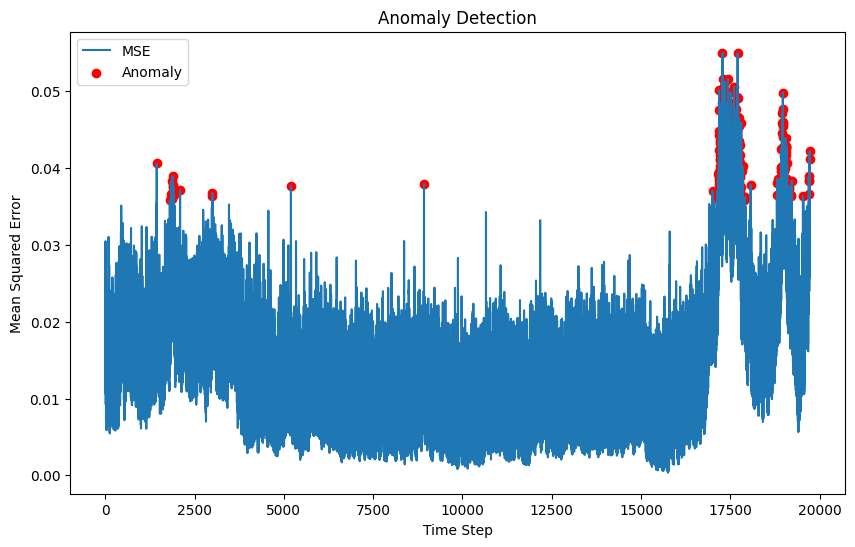

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))
plt.plot(mse, label='MSE')
plt.ylabel('Mean Squared Error')
plt.xlabel('Time Step')
anomalies_indices = np.where(anomalies)[0]
plt.scatter(anomalies_indices, mse[anomalies_indices], color='r', label='Anomaly')
plt.title('Anomaly Detection')
plt.legend()
plt.show()


In [ ]:
# anomalies_indices = np.where(anomalies)[0]
# anomalies_indices

# **Autoencoders and Decoders**

In [ ]:
scaler = MinMaxScaler()
df_scaled = scaler.fit_transform(df)

# Split data into training and test sets
X_train, X_test = train_test_split(df_scaled, test_size=0.2, random_state=42)

In [ ]:
input_dim = X_train.shape[1]

model = Sequential()
# Encoder
model.add(Dense(64, activation='relu', input_shape=(input_dim,)))
# model.add(Dropout(0.2))
model.add(Dense(32, activation='relu'))
# model.add(Dropout(0.2))

# Decoder
model.add(Dense(64, activation='relu'))
model.add(Dense(input_dim, activation='sigmoid'))  # Output layer

model.compile(optimizer='adam', loss='mse',  metrics=['accuracy'])


In [ ]:
history_aut = model.fit(X_train, X_train,  # input and output are the same for autoencoders
          epochs=10,
          batch_size=16,
          validation_data=(X_test, X_test),
          shuffle=True)


Epoch 1/10
987/987 [==============================] - 8s 5ms/step - loss: 0.0092 - accuracy: 0.5087 - val_loss: 0.0031 - val_accuracy: 0.6405
Epoch 2/10
987/987 [==============================] - 4s 4ms/step - loss: 0.0023 - accuracy: 0.6940 - val_loss: 0.0017 - val_accuracy: 0.7294
Epoch 3/10
987/987 [==============================] - 4s 4ms/step - loss: 0.0015 - accuracy: 0.7381 - val_loss: 0.0013 - val_accuracy: 0.7474
Epoch 4/10
987/987 [==============================] - 5s 5ms/step - loss: 0.0012 - accuracy: 0.7454 - val_loss: 0.0011 - val_accuracy: 0.7545
Epoch 5/10
987/987 [==============================] - 4s 4ms/step - loss: 9.6534e-04 - accuracy: 0.7613 - val_loss: 8.6536e-04 - val_accuracy: 0.8295
Epoch 6/10
987/987 [==============================] - 4s 4ms/step - loss: 7.8910e-04 - accuracy: 0.7820 - val_loss: 7.0222e-04 - val_accuracy: 0.7558
Epoch 7/10
987/987 [==============================] - 5s 5ms/step - loss: 6.6771e-04 - accuracy: 0.7910 - val_loss: 6.3833e-04 - val

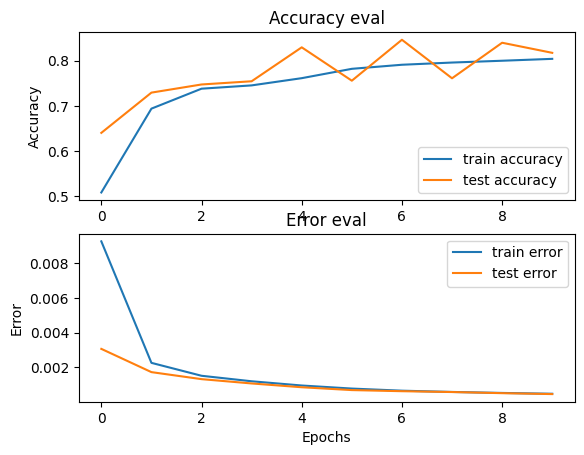

In [ ]:
plot_history(history_aut)

In [ ]:
reconstructions = model.predict(X_test)

mse = np.mean(np.power(X_test - reconstructions, 2), axis=1)


124/124 [==============================] - 0s 2ms/step


In [ ]:
print(X_test.shape)

(3947, 28)


In [ ]:
print(len(mse))

3947


In [ ]:
anomaly_threshold = np.percentile(mse, 99)  # Example: 95th percentile
anomalies = mse > anomaly_threshold


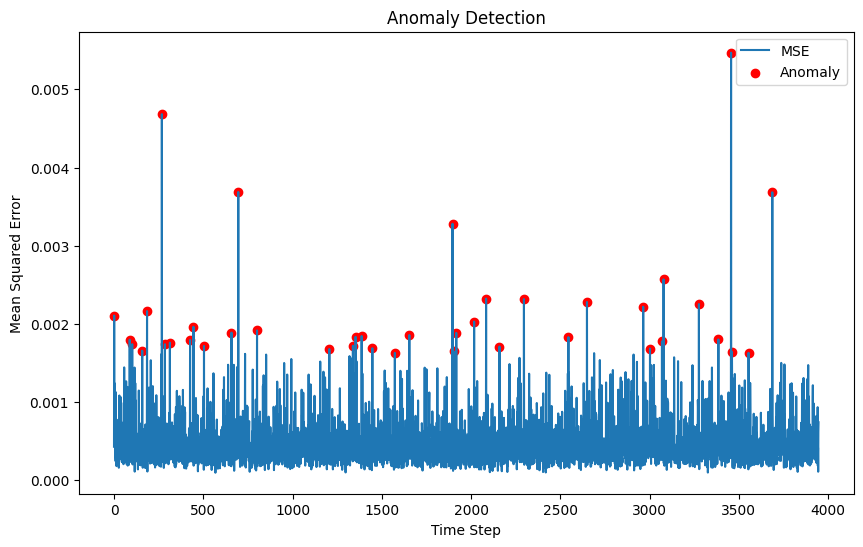

In [ ]:
import matplotlib.pyplot as plt

# Plot MSE
plt.figure(figsize=(10,6))
plt.plot(mse, label='MSE')
plt.ylabel('Mean Squared Error')
plt.xlabel('Time Step')

# Highlight anomalies
anomalies_indices = np.where(anomalies)[0]
plt.scatter(anomalies_indices, mse[anomalies_indices], color='r', label='Anomaly')

plt.title('Anomaly Detection')
plt.legend()
plt.show()


# **Continual Learning(RL)**

In [ ]:
df_ad = df.copy()

In [ ]:
train_data, test_data = train_test_split(df_ad, test_size=0.2)

# Initialize parameters
num_features = train_data.shape[1] - 1  # Assuming last column is the target
num_actions = 2  # High (1) or low (0) energy usage

# Function to initialize Q-model
def initialize_q_model(num_features, num_actions):
    model = Sequential()
    model.add(Dense(64, input_dim=num_features, activation='relu'))
    model.add(Dense(32, activation='relu'))
    model.add(Dense(num_actions, activation='linear'))
    model.compile(loss='mse', optimizer='adam')
    return model

q_model = initialize_q_model(num_features, num_actions)

learning_rate = 0.1
discount_factor = 0.9
epsilon = 0.2
num_episodes = 1000

# Function to get initial state from dataset
def get_initial_state_from_dataset(data, index):
    return data.iloc[index, :-1].values  # Assuming last column is the target

# Function to predict energy usage
def predict_energy_usage(state, action):
    # Define the threshold to split energy usage into high and low
    energy_values = [0, 10, 20, 30, 40, 50, 60, 70]
    median_value = np.median(energy_values)

    # Predict high or low usage based on the action
    if action == 1:  # High energy usage
        # Return a value greater than the median
        high_usage_value = max(energy_values, key=lambda x: x > median_value)
    else:  # Low energy usage
        # Return a value less than or equal to the median
        low_usage_value = min(energy_values, key=lambda x: x <= median_value)

    return high_usage_value if action == 1 else low_usage_value

In [ ]:
def calculate_reward(predicted_usage, actual_usage):
    # Simple reward calculation
    return -abs(predicted_usage - actual_usage)

In [ ]:
# # def get_next_state_from_dataset(data, current_state):
# #     # Find the index of the current state in the dataset
# #     current_index = data.index[data.iloc[:, :-1].values == current_state].tolist()[0]
# #     # Get the state of the next time step
# #     if current_index + 1 < len(data):
# #         return data.iloc[current_index + 1, :-1].values
# #     else:
# #         return None  # Indicates end of data
# def get_next_state_from_dataset(data, current_state):
#     # Convert the current state to a DataFrame row for comparison
#     state_df = pd.DataFrame([current_state], columns=data.columns[:-1])  # Exclude the target column

#     # Find the row in data that matches the current state
#     matching_rows = data[(data.iloc[:, :-1] == state_df.iloc[0]).all(axis=1)]

#     # Get the index of the matching row
#     if not matching_rows.empty:
#         current_index = matching_rows.index[0]
#         # Check if there is a next state
#         if current_index + 1 < len(data):
#             # Return the state of the next time step
#             return data.iloc[current_index + 1, :-1].values
#         else:
#             # If there is no next state, handle it (e.g., return None)
#             return None
#     else:
#         # Handle the case where no matching row is found
#         # This will depend on your specific requirements
#         return default_next_state  # You need to define this
def get_next_state_from_dataset(data, current_state):
    # Convert the current state to a DataFrame row for comparison
    state_df = pd.DataFrame([current_state], columns=data.columns[:-1])  # Exclude the target column

    # Find the row in data that matches the current state
    matching_rows = data[(data.iloc[:, :-1] == state_df.iloc[0]).all(axis=1)]

    # Get the index of the matching row
    if not matching_rows.empty:
        # Get the current index as a datetime object
        current_index = matching_rows.index[0]

        # Find the next index in the DataFrame
        # Here, we handle datetime index correctly
        next_index = data.index[data.index > current_index].min()

        # Check if there is a next state
        if not pd.isna(next_index) and next_index in data.index:
            # Return the state of the next time step
            return data.loc[next_index, data.columns[:-1]].values
        else:
            # If there is no next state, handle it (e.g., return None)
            return None
    else:
        # Handle the case where no matching row is found
        return None  # Or however you want to handle this case



In [ ]:
def update_q_model(model, state, action, reward, next_state, learning_rate, discount_factor):
    # Predict Q-values for current state
    current_q = model.predict(state.reshape(1, -1))[0]

    # Predict Q-values for next state
    next_max_q = np.max(model.predict(next_state.reshape(1, -1))) if next_state is not None else 0

    # Update Q-value for the action taken
    current_q[action] = current_q[action] + learning_rate * (reward + discount_factor * next_max_q - current_q[action])

    # Fit model
    model.fit(state.reshape(1, -1), current_q.reshape(1, -1), epochs=1, verbose=0)


In [ ]:
# def get_actual_usage(data, state):
#     # Find the index of the current state in the dataset
#     current_index = data.index[data.iloc[:, :-1].values == state].tolist()[0]
#     # Get the actual energy usage value from the dataset
#     actual_usage = data.iloc[current_index, -1]  # Assuming last column is energy usage
#     return actual_usage
def get_actual_usage(data, state):
    # Convert state array to a DataFrame row for comparison
    state_df = pd.DataFrame([state], columns=data.columns[:-1])  # Exclude the target column

    # Find the row in data that matches the state
    matching_rows = data[(data.iloc[:, :-1] == state_df.iloc[0]).all(axis=1)]

    # If a matching row is found, return its energy usage value
    if not matching_rows.empty:
        return matching_rows.iloc[0, -1]  # Assuming the energy usage is in the last column
    else:
        # Handle the case where no matching row is found
        # This will depend on how you want to handle such scenarios
        return default_energy_usage_value  # You need to define this


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Function to calculate reward
# ... (existing function) ...

# Initialize an empty list to store rewards for each episode
episode_rewards = []

# Set up real-time plotting
plt.ion()  # Turn on interactive mode
fig, ax = plt.subplots()
ax.set_title('Learning Curve over Episodes')
ax.set_xlabel('Episode')
ax.set_ylabel('Total Reward')
line, = ax.plot(episode_rewards, color='blue')

# Training loop
for episode in range(num_episodes):
    state = get_initial_state_from_dataset(train_data, episode % len(train_data))

    done = False
    total_reward = 0  # Initialize total reward for this episode
    while not done:
        if np.random.uniform(0, 1) < epsilon:
            action = np.random.choice(num_actions)
        else:
            action = np.argmax(q_model.predict(state.reshape(1, -1)))

        predicted_usage = predict_energy_usage(state, action)
        actual_usage = get_actual_usage(train_data, state)
        reward = calculate_reward(predicted_usage, actual_usage)
        total_reward += reward  # Accumulate rewards

        next_state = get_next_state_from_dataset(train_data, state)
        update_q_model(q_model, state, action, reward, next_state, learning_rate, discount_factor)

        state = next_state
        done = state is None

    episode_rewards.append(total_reward)  # Store the total reward for this episode

    # Update the plot
    line.set_ydata(episode_rewards)
    line.set_xdata(np.arange(len(episode_rewards)))
    ax.relim()
    ax.autoscale_view()
    fig.canvas.draw()
    fig.canvas.flush_events()

# Save your model
q_model.save('q_model.h5')

plt.ioff()  # Turn off interactive mode
plt.show()


Streaming output truncated to the last 5000 lines.
1/1 [==============================] - 0s 26ms/step


# **References:**
1. Understanding of LSTM https://colah.github.io/posts/2015-08-Understanding-LSTMs/
2. LSTM part-2 Architecture: https://www.youtube.com/watch?v=Akv3poqqwI4
3. Deep Q Learning: https://towardsdatascience.com/deep-q-learning-tutorial-mindqn-2a4c855abffc
4. Augmented Dickey Fuller : https://www.youtube.com/watch?v=1opjnegd_hA
5. White Noise : https://www.youtube.com/watch?v=1opjnegd_hA
6. Stationarity in Time series : https://www.youtube.com/watch?v=oY-j2Wof51c
7. Autoecnoders and Decoders: https://towardsdatascience.com/applied-deep-learning-part-3-autoencoders-1c083af4d798
